In [1]:
import scanpy as sc

import scvelo as scv
scv.settings.verbosity = 3  # show errors(0), warnings(1), info(2), hints(3)
# scv.settings.presenter_view = True  # set max width size for presenter view
scv.set_figure_params('scvelo')  # for beautified visualization

import numpy as np
import anndata as ad
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib

import re

# Preprocessing (skip if already done)

In [34]:
adata = ...
# They are actually different samples
adata = adata.copy()
adata.obs['sample_group'] = adata.obs[['sample_id', 'disease']].agg('-'.join, axis=1)

In [37]:
sc.pp.highly_variable_genes(adata, n_top_genes=4000, batch_key='sample_group')
sc.pp.pca(adata, n_comps=50)
sc.pp.neighbors(adata, n_neighbors=50, n_pcs=50)
scv.pp.moments(adata)

scv.tl.velocity(adata, 
                mode='deterministic',
                min_r2=0.01)
scv.tl.velocity_graph(adata, approx=False)
scv.tl.rank_velocity_genes(adata, groupby='manual_celltype_annotation', min_corr=.1)
scv.tl.score_genes_cell_cycle(adata)
scv.tl.velocity_confidence(adata)
scv.tl.velocity_pseudotime(adata)

Normalized count data: spliced, unspliced.
computing moments based on connectivities
    finished (0:00:27) --> added 
    'Ms' and 'Mu', moments of un/spliced abundances (adata.layers)
computing velocities
    finished (0:00:12) --> added 
    'velocity', velocity vectors for each individual cell (adata.layers)
computing velocity graph (using 1/24 cores)


  0%|          | 0/4722 [00:00<?, ?cells/s]

    finished (0:00:09) --> added 
    'velocity_graph', sparse matrix with cosine correlations (adata.uns)
ranking velocity genes


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/tools/utils.py:463: DeprecationWarning: Please import `rankdata` from the `scipy.stats` namespace; the `scipy.stats.stats` namespace is deprecated and will be removed in SciPy 2.0.0.
  from scipy.stats.stats import rankdata


    finished (0:00:29) --> added 
    'rank_velocity_genes', sorted scores by group ids (adata.uns) 
    'spearmans_score', spearmans correlation scores (adata.var)
calculating cell cycle phase
-->     'S_score' and 'G2M_score', scores of cell cycle phases (adata.obs)
--> added 'velocity_length' (adata.obs)
--> added 'velocity_confidence' (adata.obs)
--> added 'velocity_confidence_transition' (adata.obs)
computing terminal states
    identified 1 region of root cells and 2 regions of end points .
    finished (0:00:00) --> added
    'root_cells', root cells of Markov diffusion process (adata.obs)
    'end_points', end points of Markov diffusion process (adata.obs)


# Plotting

In [51]:
# Settings
adata_file = "adata-DNDP-E99K-velocity.pkl.gz"
annotation = 'manual_celltype_annotation'
sample_name = 'DNDP'
condition = 'disease'
process_condition = 'E99K'

computing velocity embedding
    finished (0:00:00) --> added
    'velocity_umap', embedded velocity vectors (adata.obsm)


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-overall_velo.pdf


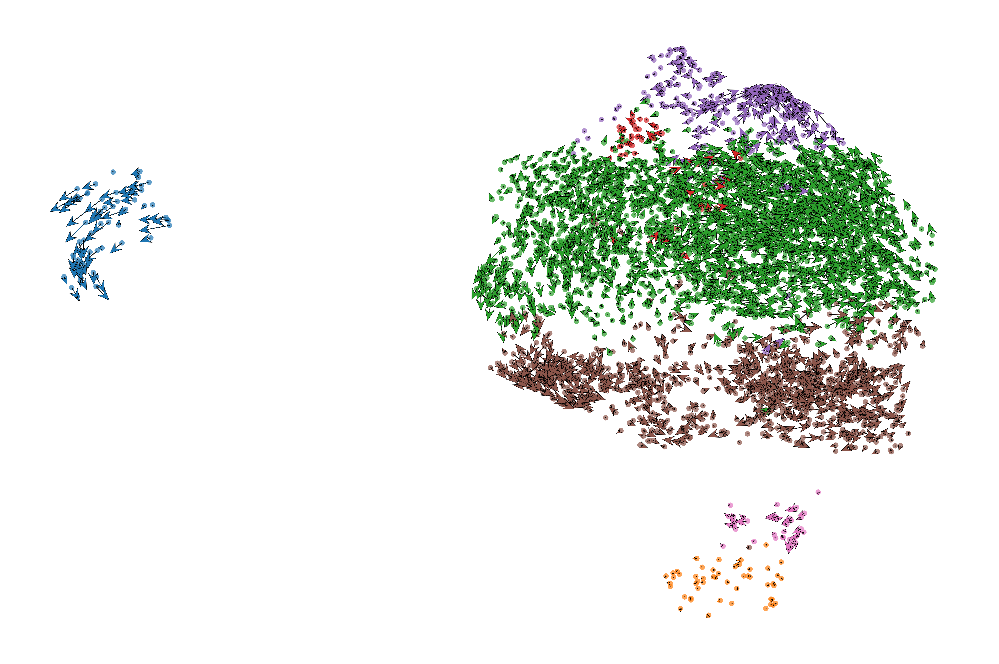

In [53]:
# Project the velocities across all cells
scv.pl.velocity_embedding(adata,
                          basis="umap",
                          arrow_size=2.0,
                          arrow_length=3.0,
                          scale=1.2,
                          alpha=0.7,
                          color=[annotation],
                          title='',
                          dpi=800,
                          save=f'{sample_name}-{process_condition}-overall_velo.pdf'
                         )

In [54]:
# https://scanpy.readthedocs.io/en/stable/api/generated/scanpy.pl.umap.html
# Project the velocities across all cells
scv.pl.velocity_embedding_stream(adata,
                                 basis="umap",
                                 alpha=0.5,
                                 color=[annotation],
                                 title='',
                                 legend_loc="right margin",
                                 dpi=800,
                                 save=f'{sample_name}-{process_condition}-overall_velo_streamline.png'
                                )

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-overall_velo_streamline.png


In [56]:
cell_types = list(adata.obs[annotation].unique())

for cell_type in cell_types:
    output_name = sanitize_name(cell_type)
    kwargs = dict(frameon=False, 
                  size=10, 
                  linewidth=1.5, 
                  alpha=0.7,
                  legend_loc='right margin',
                  smooth=True,
                  wspace=1,
                  ncols=3,
                  add_outline=cell_type,
                  save=f"{sample_name}-{process_condition}-{output_name}_top9_velo_genes.png",
                  show=False,
                  dpi=800,
                  # figsize=(14,10),
                  color=annotation,
                  # ylabel=cell_type, 
                 )

    scv.pl.scatter(adata, df[cell_type][:9], **kwargs)
    print(f"Processed {cell_type}")

print("All cell types processed.")

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-Thy1-lo_Fap-lo_fibroblasts_top9_velo_genes.png
Processed Thy1-lo Fap-lo fibroblasts


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-Thy1+ve_Fap+ve_fibroblasts_top9_velo_genes.png
Processed Thy1+ve Fap+ve fibroblasts


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-Thy1-lo_Fap+ve_fibroblasts_top9_velo_genes.png
Processed Thy1-lo Fap+ve fibroblasts


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-Pericytes_top9_velo_genes.png
Processed Pericytes


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-Neuronal_cells_top9_velo_genes.png
Processed Neuronal cells


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-Thy1+ve_Fap-lo_fibroblasts_top9_velo_genes.png
Processed Thy1+ve Fap-lo fibroblasts


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/pro

saving figure to file ./figures/scvelo_DNDP-E99K-VSMCs_top9_velo_genes.png
Processed VSMCs
All cell types processed.


In [57]:
genes = list(df[cell_type][:9])

for gene in genes:
    kwargs = dict(basis='umap',
                  size=10, 
                  linewidth=1.5, 
                  alpha=0.5,
                  legend_loc='best',
                  smooth=True,
                  # wspace=1,
                  ncols=1,
                  add_outline=True,
                  color=gene,
                  show=False,
                  var_names=gene,
                  save=f'{sample_name}-{process_condition}-{gene}_velo.png',
                  dpi=800,
                  color_map='coolwarm' # https://matplotlib.org/stable/users/explain/colors/colormaps.html
                 )

    scv.pl.velocity(adata, **kwargs)
    print(f"Processed {gene}")

print("All cell genes processed.")

saving figure to file ./figures/scvelo_DNDP-E99K-Ifit3b_velo.png
Processed Ifit3b
saving figure to file ./figures/scvelo_DNDP-E99K-Btbd10_velo.png
Processed Btbd10
saving figure to file ./figures/scvelo_DNDP-E99K-Rnase1_velo.png
Processed Rnase1
saving figure to file ./figures/scvelo_DNDP-E99K-Akr1c14_velo.png
Processed Akr1c14
saving figure to file ./figures/scvelo_DNDP-E99K-Scin_velo.png
Processed Scin
saving figure to file ./figures/scvelo_DNDP-E99K-Tbc1d9_velo.png
Processed Tbc1d9
saving figure to file ./figures/scvelo_DNDP-E99K-Fam102a_velo.png
Processed Fam102a
saving figure to file ./figures/scvelo_DNDP-E99K-Creb5_velo.png
Processed Creb5
saving figure to file ./figures/scvelo_DNDP-E99K-Adssl1_velo.png
Processed Adssl1
All cell genes processed.


In [58]:
scv.pl.scatter(adata, 
               color_gradients=['S_score', 'G2M_score'], 
               smooth=True, 
               perc=[10, 90],
               show=False,
               save=f'{sample_name}-{process_condition}-cell_cycle_score.png',
               dpi=800,
              )

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-cell_cycle_score.png


<Axes: >

In [59]:
for phase in ['G1', 'G2M', 'S']:
    kwargs = dict(frameon=False, 
                  # size=10, 
                  # linewidth=1.5, 
                  alpha=0.5,
                  legend_loc='right margin',
                  smooth=True,
                  title=f'Cell Cycle Phase - {phase}',
                  add_outline=phase, 
                  show=False,
                  dpi=800,
                  save=f'{sample_name}-{process_condition}-cell_cycle-{phase}.png',
                 )
    
    scv.pl.scatter(adata, color=['phase'], **kwargs)
    print(f"Processed {phase}")

print("All cell phases processed.")

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-cell_cycle-G1.png
Processed G1


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-cell_cycle-G2M.png
Processed G2M


/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-cell_cycle-S.png
Processed S
All cell phases processed.


In [60]:
key = 'velocity_length'
kwargs = dict(frameon=False, 
              alpha=0.5,
              legend_loc='right margin',
              vmin=0,
              cmap='coolwarm',
              c=key,
              dpi=800,
              show=False,
              smooth=True,
              title='Velocity length',
              save=f'{sample_name}-{process_condition}-{key}.png',
             )

scv.pl.scatter(adata, **kwargs)

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-velocity_length.png


<Axes: title={'center': 'Velocity length'}>

In [61]:
key = 'velocity_confidence'
kwargs = dict(frameon=False, 
              alpha=0.5,
              legend_loc='right margin',
              smooth=True,
              cmap='coolwarm',
              c=key,
              vmin=0,
              dpi=800,
              show=False,
              title='Velocity confidence',
              save=f'{sample_name}-{process_condition}-{key}.png',
             )

scv.pl.scatter(adata, **kwargs)

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-velocity_confidence.png


<Axes: title={'center': 'Velocity confidence'}>

In [63]:
kwargs = dict(frameon=False, 
              alpha=0.5,
              legend_loc='right margin',
              smooth=True,
              color='velocity_pseudotime',
              cmap='Reds', 
              dpi=800,
              show=False,
              vmin=0,
              title='Velocity pseudotime',
              save=f'{sample_name}-{process_condition}-velocity_pseudotime.png',
             )
scv.pl.scatter(adata, **kwargs)

/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])
/users/procardis/zlv560/workspace/__PYVENV/skylake/lib/python3.10/site-packages/scvelo/plotting/utils.py:63: DeprecationWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, pd.CategoricalDtype) instead
  return isinstance(c, str) and c in data.obs.keys() and cat(data.obs[c])


saving figure to file ./figures/scvelo_DNDP-E99K-velocity_pseudotime.png


<Axes: title={'center': 'Velocity pseudotime'}>